# SpaceNet PCA on MS Bands 

## Imports

In [ ]:
!pip install awscli boto3 mmdet gdal
!apt-get -q install tree

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 35.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 41.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 11.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for PyYAML: filename=PyYAML-5.4.1-cp310-cp310-linux_x86_64.whl size=45658 sha256=afde813ad88c844fd46f33bb4d7f0654aa77f40406d51cead6f53a2a2a2a5546
  Stored in directory: /root/.cache/pip/wheels/c7/0d/22/696ee92245ad710f506eee79bb05c740d8abccd3ecdb778683
Successfully bui

In [ ]:
from google.colab import drive
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import osgeo.gdal as gdal
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import cv2
import subprocess
import shutil
from skimage import exposure
from sklearn.linear_model import LinearRegression
import math
from google.colab.patches import cv2_imshow

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!export AWS_SHARED_CREDENTIALS_FILE=/content/drive/MyDrive/config/awscli.ini
path = "/content/drive/My Drive/config/awscli.ini"
os.environ['AWS_SHARED_CREDENTIALS_FILE'] = path
print(os.environ['AWS_SHARED_CREDENTIALS_FILE'])

/content/drive/My Drive/config/awscli.ini


## Global Variables

In [ ]:
SAT_IMAGES_ROOT_PATH = ''
GSD = 0.5 # metres
TIME_LAG = 0.26 # seconds

## General Functions

In [ ]:
def plot_centroid_pairs(pairs, coeffs, img):
    img_with_pairs = np.copy(img[3,:,:])
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img_with_pairs, cmap='gray')
    for pair in pairs:
        ax.plot([pair[0][1], pair[1][1]], [pair[0][0], pair[1][0]], color='r', linewidth=2)
        ax.scatter(pair[0][1], pair[0][0], s=50, color='g', marker='o')
        ax.scatter(pair[1][1], pair[1][0], s=50, color='g', marker='o')
    x = np.linspace(0, img.shape[2], num=100)
    y = coeffs[0]*x**2 + coeffs[1]*x + coeffs[2]
    ax.plot(y, x, color='b', linewidth=2)
    plt.show()

In [ ]:
def find_centroid_pairs(centroids, threshold, time_lag):
    # Fit a line to the centroids using linear regression
    x = np.array([c[0] for c in centroids]).reshape((-1, 1))
    y = np.array([c[1] for c in centroids])
    model = LinearRegression().fit(x, y)

    # Get the slope and y-intercept of the line
    slope = model.coef_[0]
    intercept = model.intercept_

    # convert time lage to hours
    time_lag = time_lag * 0.000277778

    # Find nearest neighbor for each centroid along the line
    pairs = []
    for i in range(len(centroids) - 1):
        dist, idx = min((abs((slope * centroids[i+1][0] + intercept) - centroids[i+1][1]), i+1), (threshold+1, -1))
        if idx != -1:
            pairs.append((centroids[i], centroids[idx]))

    # Calculate distance and speed for each pair
    results = []
    speeds = []
    for pair in pairs:

        distance = math.sqrt((pair[1][0]-pair[0][0])**2 + (pair[1][1]-pair[0][1])**2)
        distance = distance * 5e-4 # convert to km 

        speed = distance / time_lag
        speeds.append(speed)

        results.append({'pair': pair, 'distance': distance, 'speed': speed})

    if len(pairs) > 0:
      avg_speed = np.median(speeds)
    else:
      avg_speed = 0
      
    return results, avg_speed

In [ ]:
def find_centroid_pairs(centroids, threshold, time_lag):
    # Fit a quadratic curve to the centroids
    x = np.array([c[0] for c in centroids])
    y = np.array([c[1] for c in centroids])
    coeffs = np.polyfit(x, y, 2)

    # Get the coefficients of the quadratic equation
    a = coeffs[0]
    b = coeffs[1]
    c = coeffs[2]

    # Convert time lag to hours
    time_lag = time_lag * 0.000277778

    # Find nearest neighbor for each centroid along the quadratic curve
    pairs = []
    for i in range(len(centroids) - 1):
        x1 = centroids[i][0]
        y1 = centroids[i][1]
        x2 = centroids[i+1][0]
        y2 = centroids[i+1][1]
        x = np.linspace(x1, x2, num=100)
        y = a*x**2 + b*x + c
        dists = np.sqrt((y - y2)**2 + (x - x2)**2)
        min_dist_idx = np.argmin(dists)
        min_dist = dists[min_dist_idx]
        if min_dist <= threshold:
            pairs.append((centroids[i], centroids[i+1]))

    # Calculate distance and speed for each pair
    results = []
    speeds = []
    for pair in pairs:
        x1 = pair[0][0]
        y1 = pair[0][1]
        x2 = pair[1][0]
        y2 = pair[1][1]
        distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        distance = distance * 5e-4 # convert to km 
        speed = distance / time_lag
        speeds.append(speed)
        results.append({'pair': pair, 'distance': distance, 'speed': speed})

    if len(pairs) > 0:
        avg_speed = np.median(speeds)
    else:
        avg_speed = 0
      
    return results, avg_speed, (a,b,c)

In [ ]:
def get_tif_files(directory_path):
    """
    Returns a list of all files ending in .tif in the given directory path.

    Args:
        directory_path (str): Path of the directory to search for .tif files.

    Returns:
        list: List of all files ending in .tif in the given directory path.
    """
    # Initialize an empty list to store the .tif files
    tif_files = []

    # Loop through all files in the directory
    for file in os.listdir(directory_path):
        # Check if the file ends with .tif
        if file.endswith('.tif'):
            # Append the file path to the list
            tif_files.append(os.path.join(directory_path, file))

    # Return the list of .tif files
    return tif_files

In [ ]:
def tif_to_array(tif_path):
    ds = gdal.Open(tif_path)
    array = np.array([ds.GetRasterBand(i).ReadAsArray() for i in range(1, ds.RasterCount + 1)])
    array = array.transpose((1,2,0))

    print("array shape: {}".format(array.shape))
    return array

In [ ]:
def apply_pca_to_wv2_image(ms_img, n_components=5):
    """
    Apply PCA to resampled multispectral bands of WV2 images for change detection.
    
    Args:
        ms_img (ndarray): Multispectral image (MS) of WV2.
        n_components (int): Number of PCA components to retain (default: 5).
    
    Returns:
        ndarray: Reconstructed images using the first n_components of PCA.
    """
    # Normalize the pixel values
    images = ms_img.astype(float)
    images /= 255.0  # assuming pixel values range from 0 to 255

    # Transpose the array to change the shape
    images = np.transpose(images, (2, 0, 1))

    print("images shape after stacking: {}".format(images.shape))
    n_samples, width, height = images.shape
    
    # Reshape the images to a 2D array
    X = np.reshape(images, (n_samples, -1))
    print("X shape: {}".format(X.shape))

    # Standardize the data
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Apply PCA with n_components
    pca = PCA(n_components=n_components)
    pca.fit(X)
    
    # Reconstruct the images using the first n_components of PCA
    pc1_to_pcN = pca.components_[:n_components]
    reconstructed_images = np.dot(pca.transform(X)[:,:n_components], pc1_to_pcN) + pca.mean_
    reconstructed_images = np.reshape(reconstructed_images, (n_samples, width, height))
    print("reconstructed images shape: {}".format(reconstructed_images.shape))
    
    """
    fig, axs = plt.subplots(n_components, 1, figsize=(100, 100))
    
    for i in range(n_components):
        axs[i].imshow(reconstructed_images[i, :, :], cmap='gray')
        axs[i].set_title('PC{} - Channel {}'.format(i+1, i+1))
        axs[i].axis('off')
    """
    fig, ax = plt.subplots(figsize=(100, 100))
    ax.imshow(reconstructed_images[3, :, :], cmap='gray')
    ax.set_title('PC{} - Channel {}'.format(4, 1))
    ax.axis('off')

    plt.tight_layout()
    plt.show()

    
    return reconstructed_images

In [ ]:
def show_images_mul(mul_imgs, ms1=False, ms2=False):

  fig, axes = plt.subplots(nrows=mul_imgs.shape[0], ncols=mul_imgs.shape[0], figsize=(8, 8))

  # Normalize DN values to [0, 1] for each image
  mul_imgs = (mul_imgs - np.min(mul_imgs, axis=(1, 2, 3), keepdims=True)) / (np.max(mul_imgs, axis=(1, 2, 3), keepdims=True) - np.min(mul_imgs, axis=(1, 2, 3), keepdims=True))

  for i, ax in enumerate(axes.flat):
    if i < mul_imgs.shape[0]:
      if ms1:
        print("Printing images across ms1 bands")
        ax.imshow(mul_imgs[i, :, :, :3])  # show the first 3 channels (RGBNIR1)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
      elif ms2:
        print("Printing images across ms2 bands")
        ax.imshow(mul_imgs[i, :, :,5:8])  # show the last 3 channels (RedEdge, Yellow, Coastal, NIR2)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
      else:
        print("Printing images across all bands")
        ax.imshow(mul_imgs[i, :, :, :])  # show the first 3 channels (RGBNIR1)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
      
  plt.tight_layout()
  plt.show()


def show_image_mul(mul_img, ms1=False, ms2=False):
    fig, ax = plt.subplots(figsize=(16, 16))

    # Normalize DN values to [0, 1] for each band
    mul_img = (mul_img - np.min(mul_img, axis=(0, 1), keepdims=True)) / (np.max(mul_img, axis=(0, 1), keepdims=True) - np.min(mul_img, axis=(0, 1), keepdims=True))

    if ms1:
        print("Printing image with ms1 bands")
        ax.imshow(mul_img[:, :, :3])  # show the first 3 channels (RGBNIR1)
        ax.set_title("Image with MS1 bands")
        ax.axis('off')
    elif ms2:
        print("Printing image with ms2 bands")
        ax.imshow(mul_img[:, :, 5:8])  # show the last 3 channels (RedEdge, Yellow, Coastal, NIR2)
        ax.set_title("Image with MS2 bands")
        ax.axis('off')
    else:
        print("Printing image with all bands")
        ax.imshow(mul_img[:, :, :])  # show all bands
        ax.set_title("Image with all bands")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def extract_vehicle_centroids(pc_change_image, channel_index=0, compactness_threshold=0.1, area_threshold=10):
    """
    Extract centroids of moving vehicles from PCA change image based on morphological features.

    Args:
        pc_change_image (ndarray): PCA change image.
        channel_index (int): Index of the channel to use for processing (default: 0).
        compactness_threshold (float): Threshold for compactness (default: 0.5).
        area_threshold (int): Threshold for area (default: 100).

    Returns:
        ndarray: Centroids of moving vehicles.
    """
    # Extract the specific channel for processing
    pc_change_image = pc_change_image[3, :, :]

    # Convert PCA change image to binary image based on thresholding
    _, binary_image = cv2.threshold(pc_change_image.astype(np.uint8), 0, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Initialize list to store centroids
    centroids = []

    # Loop through contours and extract centroids of objects based on morphological features
    for contour in contours:
        # Calculate compactness of contour
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        compactness = 0 if perimeter == 0 else 4 * np.pi * area / (perimeter * perimeter)

        # Check if compactness and area meet threshold criteria
        if compactness >= compactness_threshold and area >= area_threshold:
            # Extract centroid of contour and add to list
            M = cv2.moments(contour)
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            centroids.append((cX, cY))

    # Convert centroids to numpy array and return
    centroids = np.array(centroids)

    # Plot the centroids on the pc_change_image
    fig, ax = plt.subplots(figsize=(100,100))
    ax.imshow(pc_change_image, cmap='gray')
    ax.scatter(centroids[:, 0], centroids[:, 1], s=100, c='red')
    plt.show()
    return centroids

In [ ]:
def copy_files(source_dir, dest_dir):
    """
    Copy all files from source_dir to dest_dir (ignoring directories).
    """
    # Create destination directory if it doesn't exist
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    
    # Copy each file in source directory to destination directory
    for file_name in os.listdir(source_dir):
        source_file = os.path.join(source_dir, file_name)
        dest_file = os.path.join(dest_dir, file_name)
        print("copying {}".format(source_file))
        if os.path.isfile(source_file):
            shutil.copy2(source_file, dest_file)

In [ ]:
def normalize_images(imgs):
    """Normalize image pixel values to [0, 1] range."""
    imgs = (imgs - np.min(imgs, axis=(1, 2, 3), keepdims=True)) / (np.max(imgs, axis=(1, 2, 3), keepdims=True) - np.min(imgs, axis=(1, 2, 3), keepdims=True))

    return imgs

## Data

### Get Data from Drive

In [ ]:
%mkdir /content/images

In [ ]:
parent_dirs = ["/content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/"]
target_dirs = ['/content/images']

for parent_dir, target_dir in zip(parent_dirs, target_dirs):
  copy_files(parent_dir, target_dir)

copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/processed
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/blackburn_30361032.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/blackburn_30361033.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/havering_m25_5790a.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/havering_m25_5790b.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/hounslow_m4_2188a.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/hounslow_m4_2188b.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/trafford_m60_9083a.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/trafford_m60_9086b.tif
copying /content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/luton_m1_2557a.tif

### Check Tree Structure

In [ ]:
!tree images

images
├── blackburn_30361032.tif
├── blackburn_30361033.tif
├── havering_m25_5790a.tif
├── havering_m25_5790b.tif
├── hounslow_m4_2188a.tif
├── hounslow_m4_2188b.tif
├── luton_m1_2557a.tif
├── luton_m1_2557b.tif
├── trafford_m60_9083a.tif
└── trafford_m60_9086b.tif

0 directories, 10 files


## One Satellite Image Example

In [ ]:
file_path = '/content/images/blackburn_30361032.tif'

ms_img = tif_to_array(file_path)

array shape: (1120, 2418, 8)


### Visualise Image

Printing image with ms1 bands


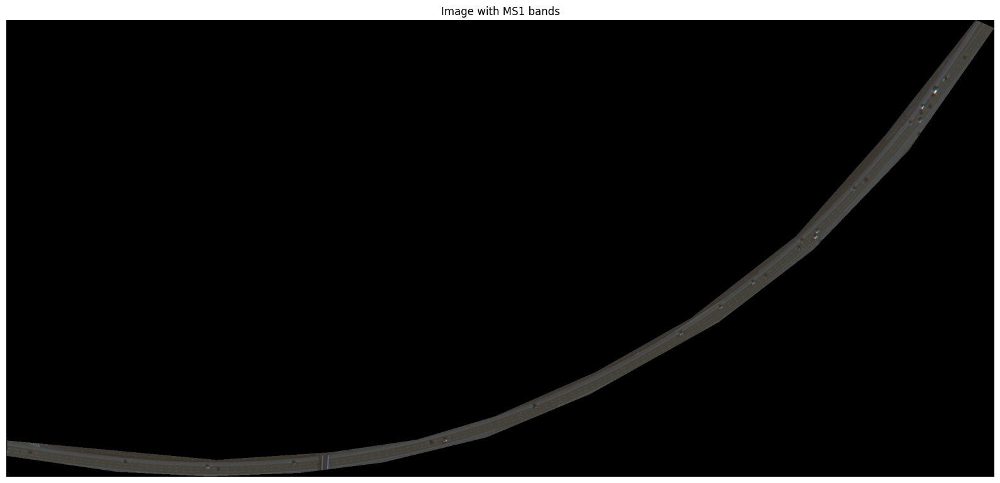

In [ ]:
show_image_mul(ms_img, ms1=True, ms2=False)

### PCA

images shape after stacking: (8, 1120, 2418)
X shape: (8, 2708160)
reconstructed images shape: (8, 1120, 2418)


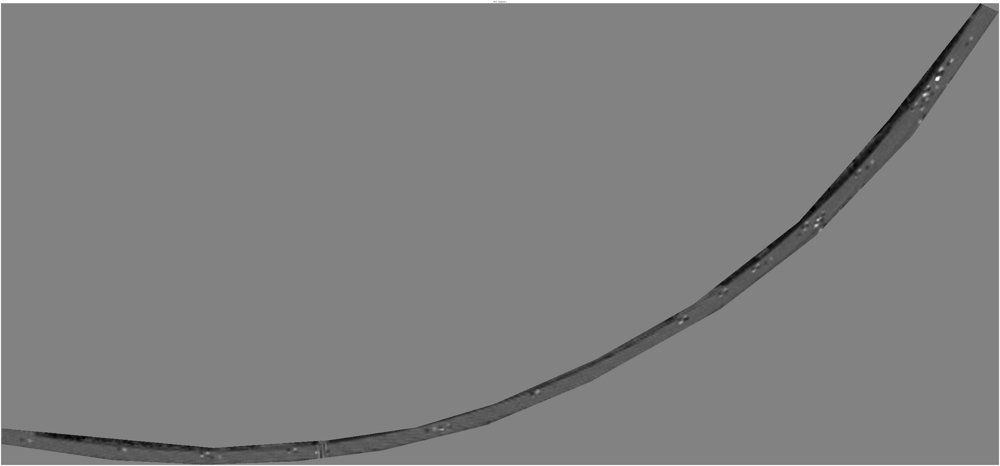

In [ ]:
recon_imgs = apply_pca_to_wv2_image(ms_img, n_components=4)

### Vehicle Object Extraction

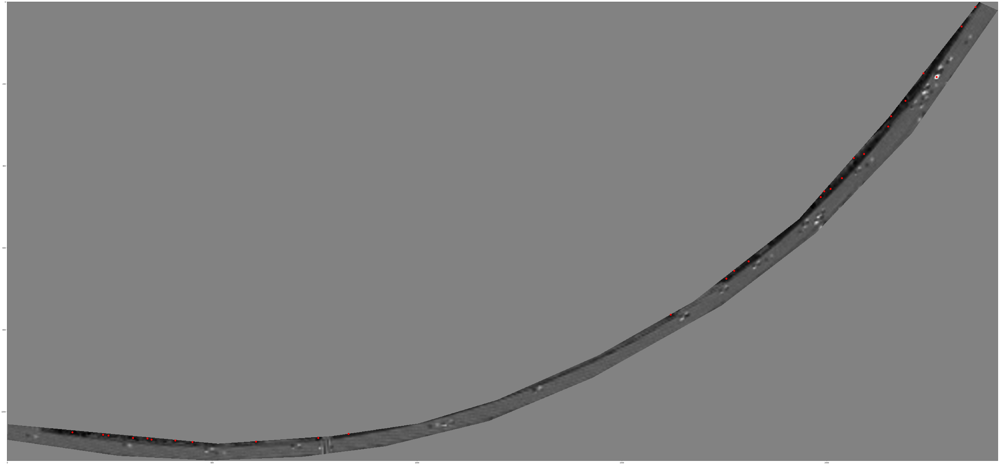

array([[ 452, 1074],
       [ 607, 1073],
       [ 410, 1070],
       [ 352, 1068],
       [ 342, 1065],
       [ 759, 1064],
       [ 307, 1064],
       [ 247, 1058],
       [ 833, 1054],
       [ 234, 1056],
       [ 159, 1050],
       [1619,  763],
       [1755,  675],
       [1774,  656],
       [1809,  633],
       [1985,  476],
       [1994,  462],
       [2009,  456],
       [2037,  430],
       [2066,  381],
       [2091,  371],
       [2150,  304],
       [2157,  279],
       [2192,  241],
       [2268,  183],
       [2236,  174],
       [2329,   60],
       [2363,   12]])

In [ ]:
extract_vehicle_centroids(recon_imgs)

## All Satellite Images

### Load Images

array shape: (1120, 2418, 8)
array shape: (1133, 2474, 8)
array shape: (4602, 1146, 8)
array shape: (4350, 1067, 8)
array shape: (1525, 3776, 8)
array shape: (1506, 3745, 8)
array shape: (1518, 1717, 8)
array shape: (1479, 1699, 8)
array shape: (2864, 1745, 8)
array shape: (2846, 1741, 8)
Printing image with ms1 bands


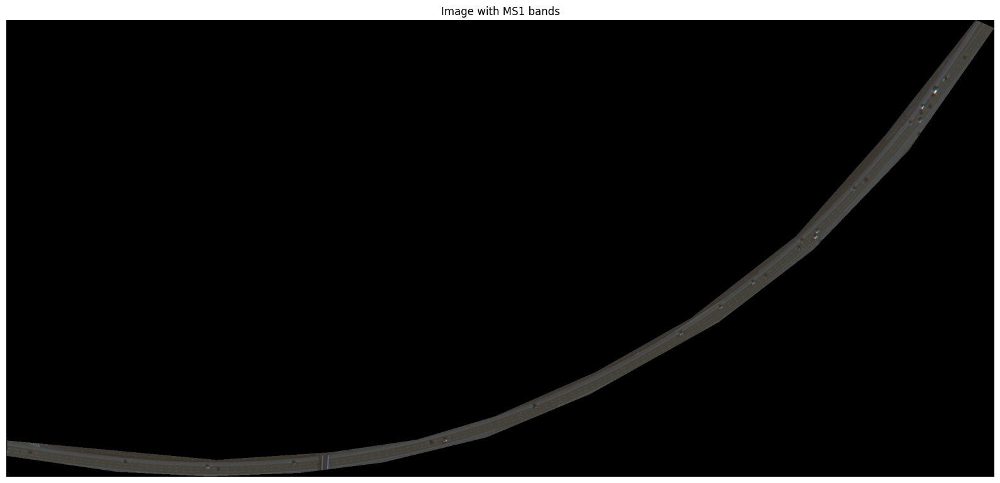

In [ ]:
ms_image_paths = get_tif_files("/content/drive/MyDrive/Spatial_Finance_Transport/data/satellite_images/")

ms_images_list = []

for ms_image_path in ms_image_paths:
  ms_img = tif_to_array(ms_image_path)

  ms_images_list.append(ms_img)

show_image_mul(ms_images_list[0], ms1=True, ms2=False)

### PCA

images shape after stacking: (8, 1120, 2418)
X shape: (8, 2708160)
reconstructed images shape: (8, 1120, 2418)


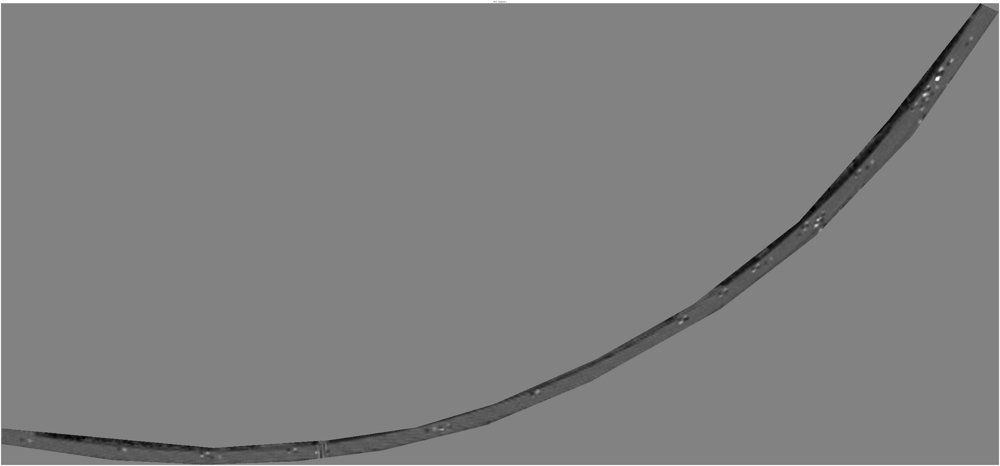

images shape after stacking: (8, 1133, 2474)
X shape: (8, 2803042)
reconstructed images shape: (8, 1133, 2474)


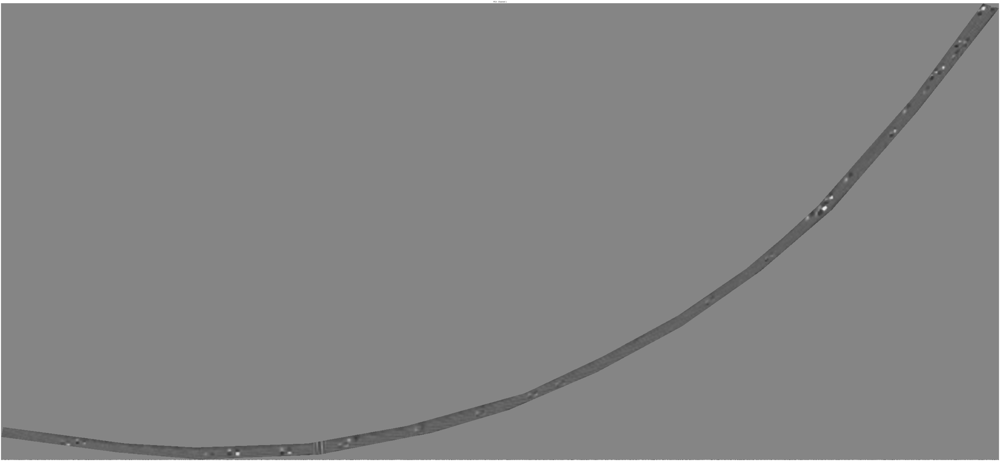

images shape after stacking: (8, 4602, 1146)
X shape: (8, 5273892)
reconstructed images shape: (8, 4602, 1146)


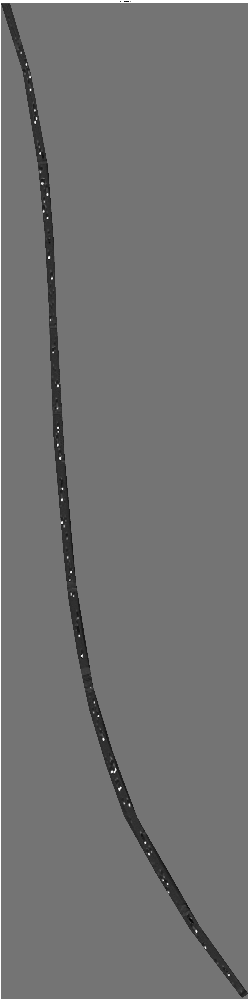

images shape after stacking: (8, 4350, 1067)
X shape: (8, 4641450)
reconstructed images shape: (8, 4350, 1067)


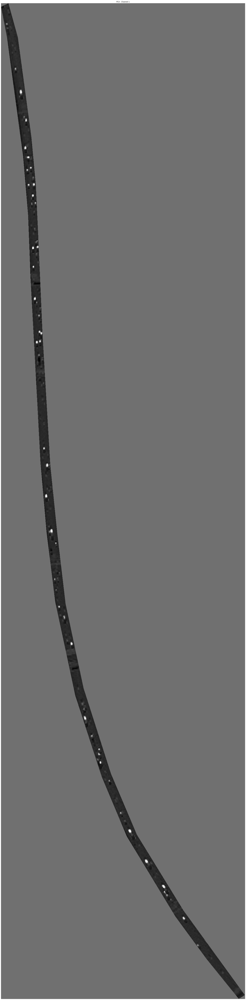

images shape after stacking: (8, 1525, 3776)
X shape: (8, 5758400)
reconstructed images shape: (8, 1525, 3776)


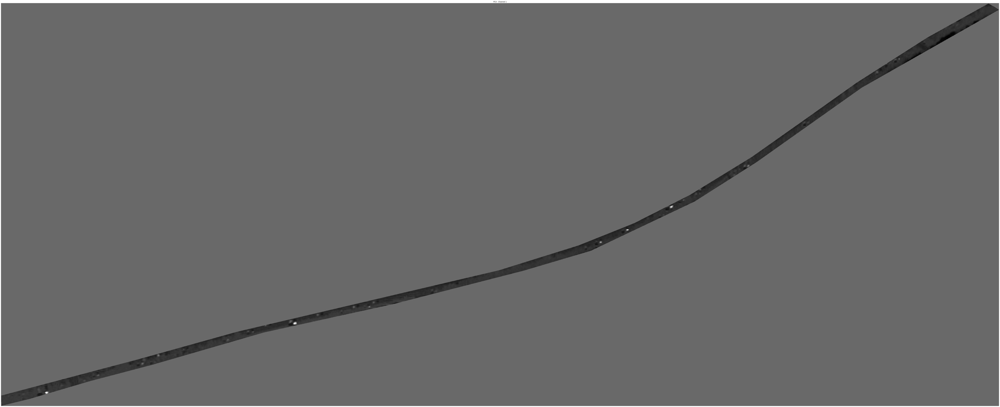

images shape after stacking: (8, 1506, 3745)
X shape: (8, 5639970)
reconstructed images shape: (8, 1506, 3745)


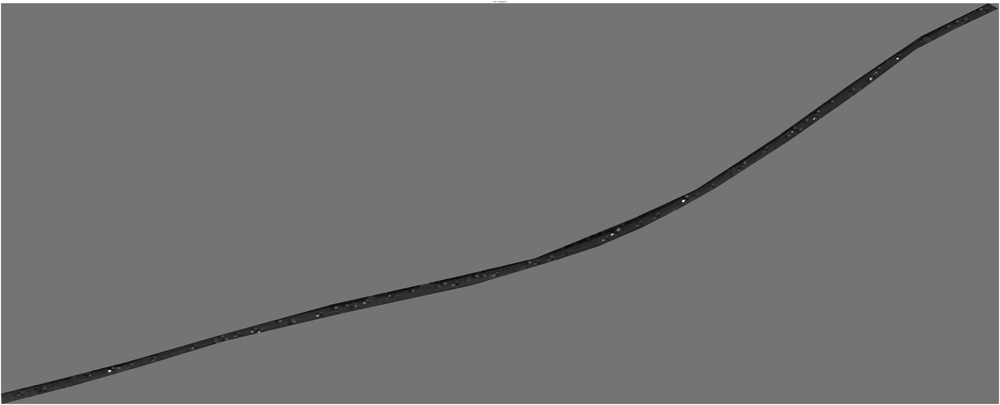

images shape after stacking: (8, 1518, 1717)
X shape: (8, 2606406)
reconstructed images shape: (8, 1518, 1717)


images shape after stacking: (8, 1479, 1699)
X shape: (8, 2512821)
reconstructed images shape: (8, 1479, 1699)


images shape after stacking: (8, 2864, 1745)
X shape: (8, 4997680)
reconstructed images shape: (8, 2864, 1745)


images shape after stacking: (8, 2846, 1741)
X shape: (8, 4954886)
reconstructed images shape: (8, 2846, 1741)


In [ ]:
recon_imgs_list = []

for ms_img in ms_images_list:
  recon_imgs = apply_pca_to_wv2_image(ms_img, n_components=4)

  recon_imgs_list.append(recon_imgs)

### Vehicle Object Extraction

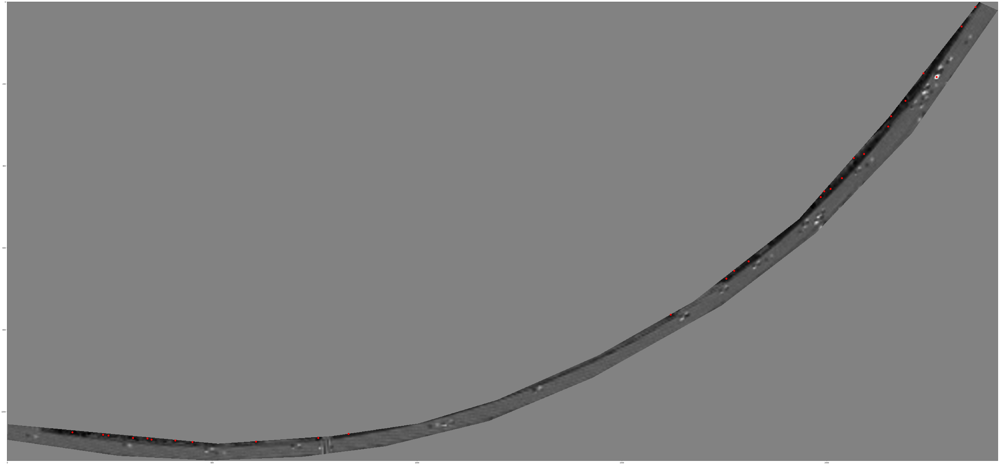

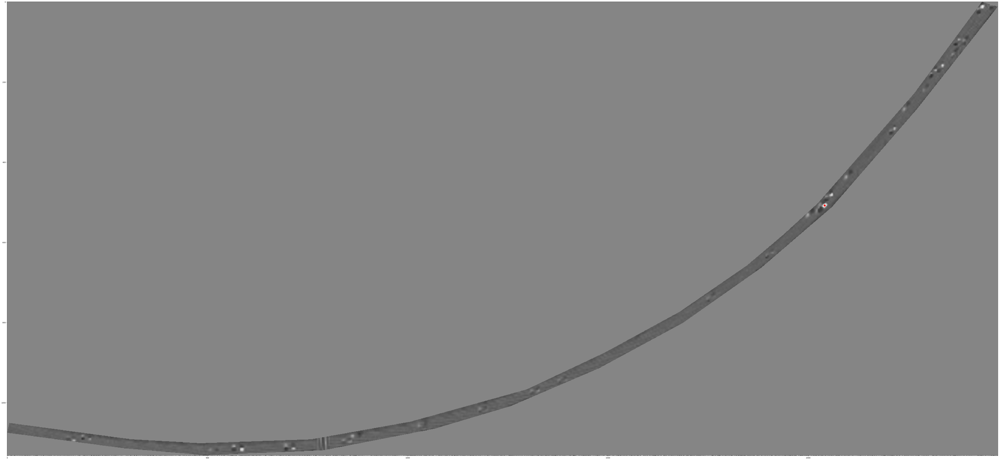

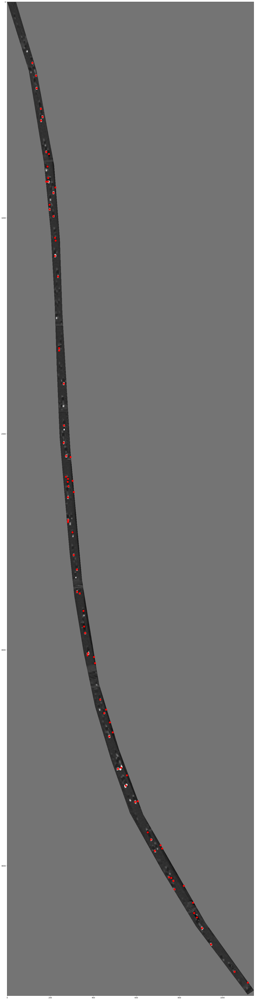

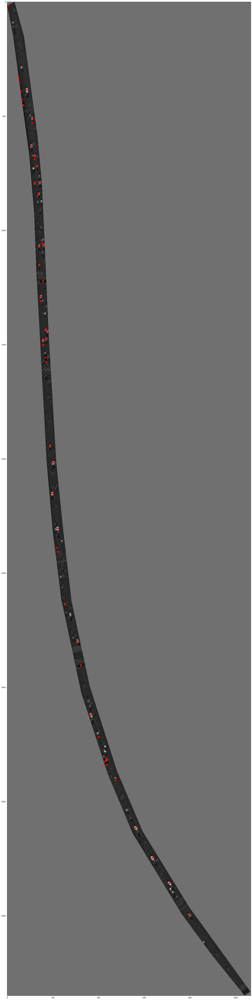

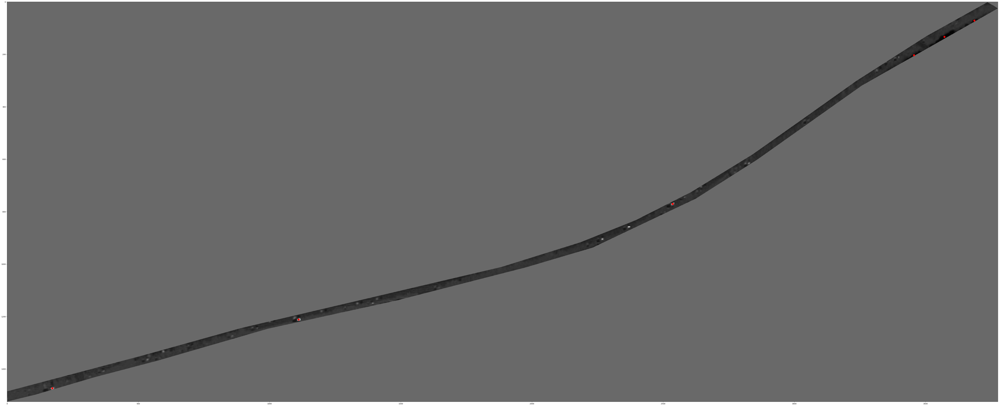

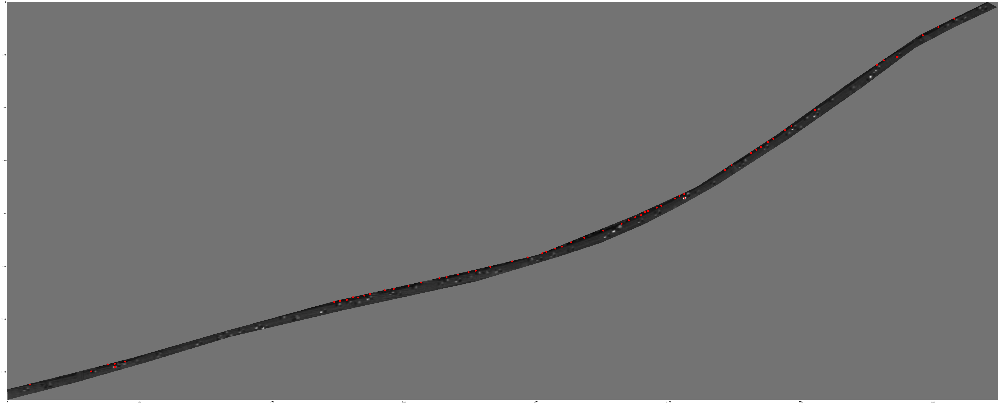

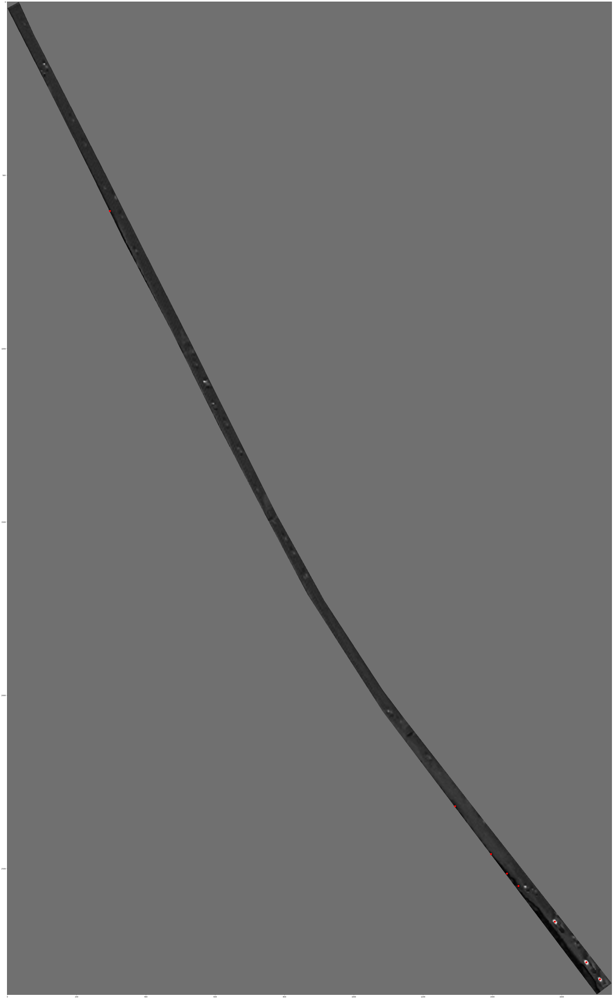

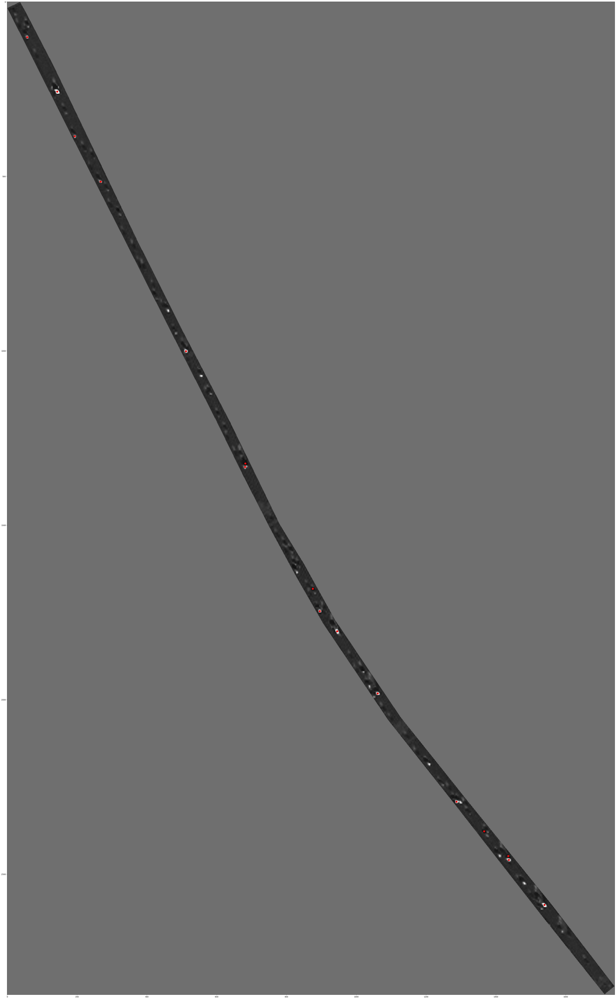

In [ ]:
vehicle_centroid_list = []

for recon_img in recon_imgs_list:

  centroids = extract_vehicle_centroids(recon_img)

  vehicle_centroid_list.append(centroids)

### Speeds

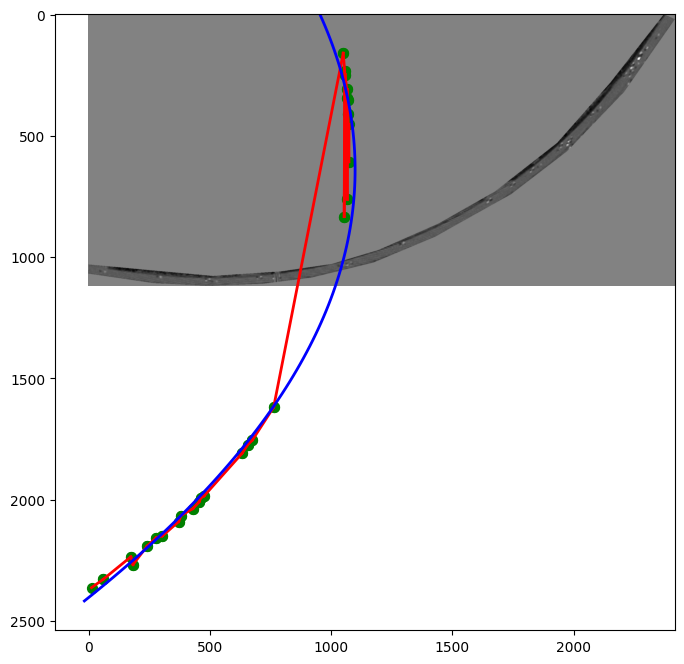

<ipython-input-33-126bdfc97134>:6: RankWarning: Polyfit may be poorly conditioned
  results, avg_speed, coeffs = find_centroid_pairs(centroids, threshold=100, time_lag=0.26)


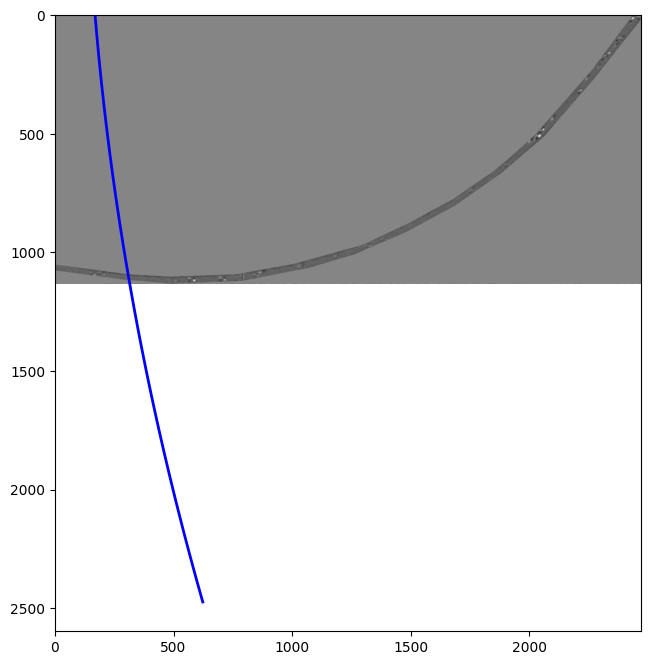

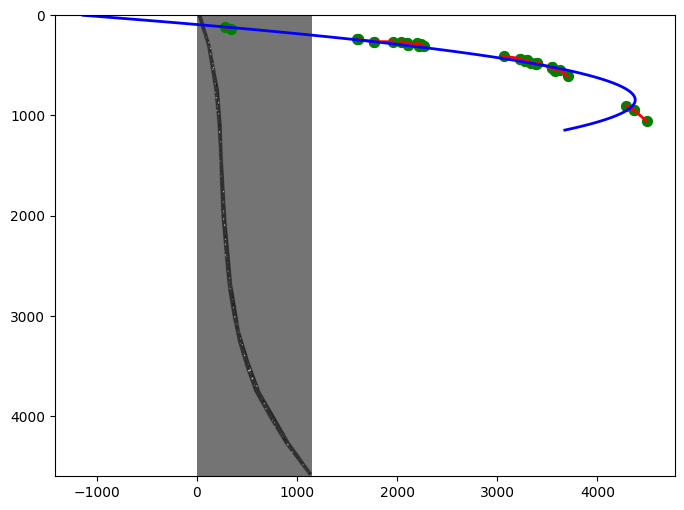

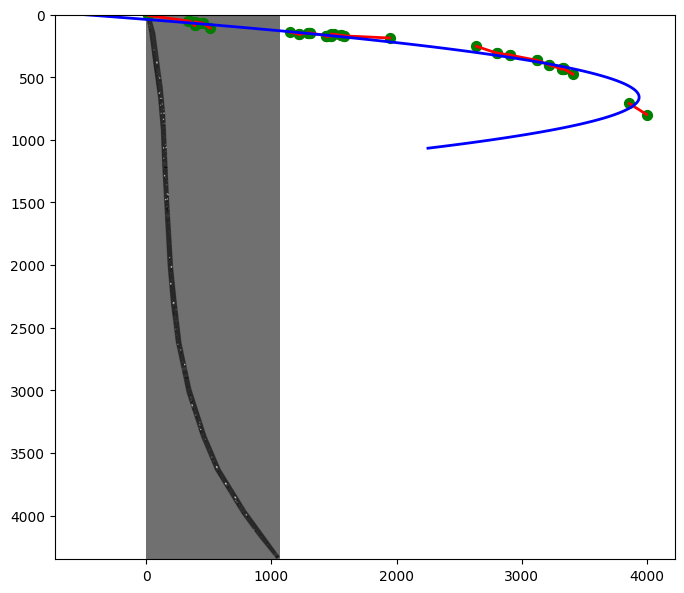

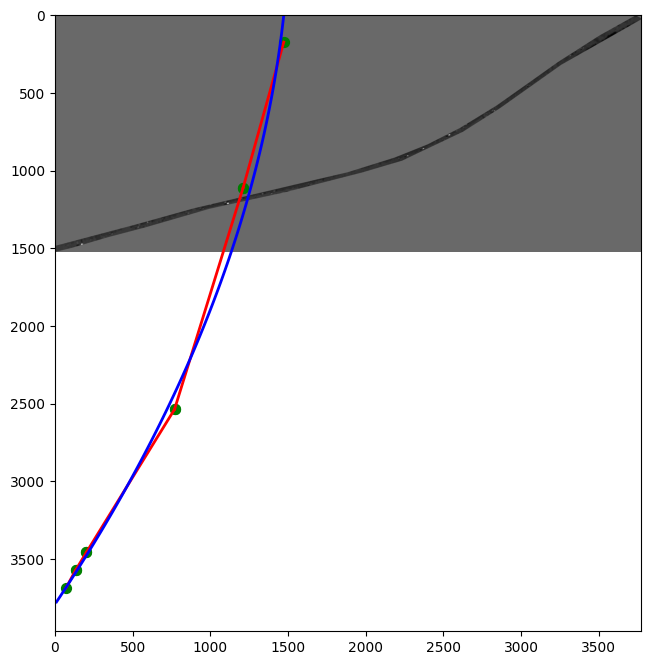

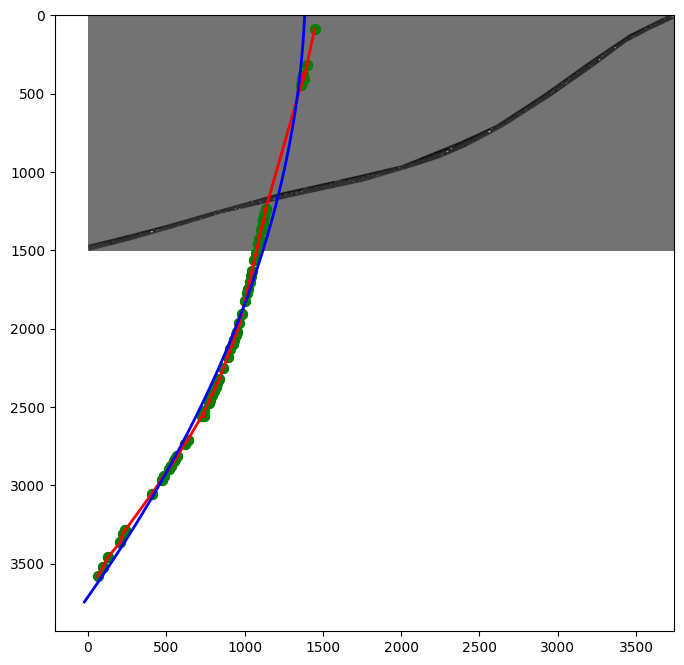

<ipython-input-33-126bdfc97134>:6: RankWarning: Polyfit may be poorly conditioned
  results, avg_speed, coeffs = find_centroid_pairs(centroids, threshold=100, time_lag=0.26)


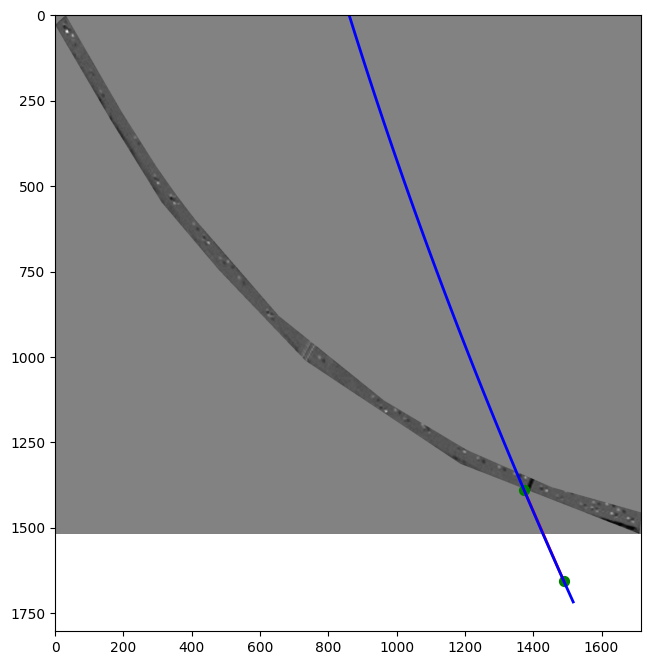

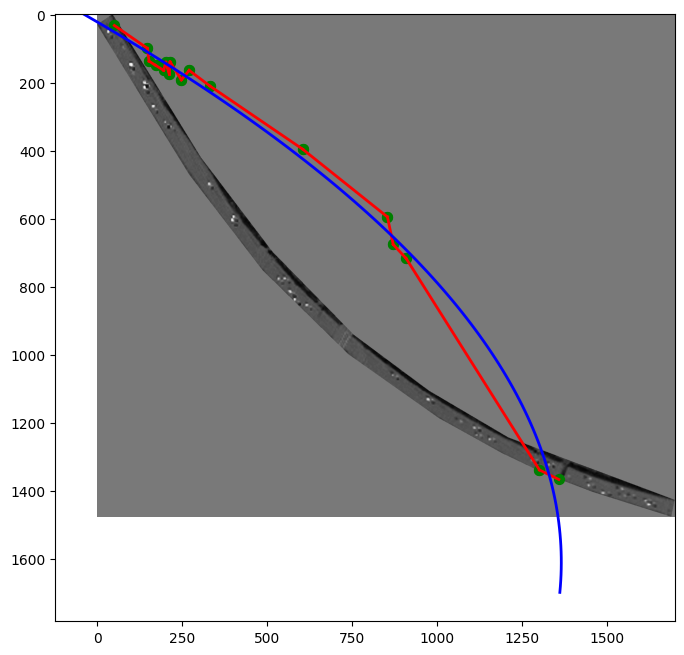

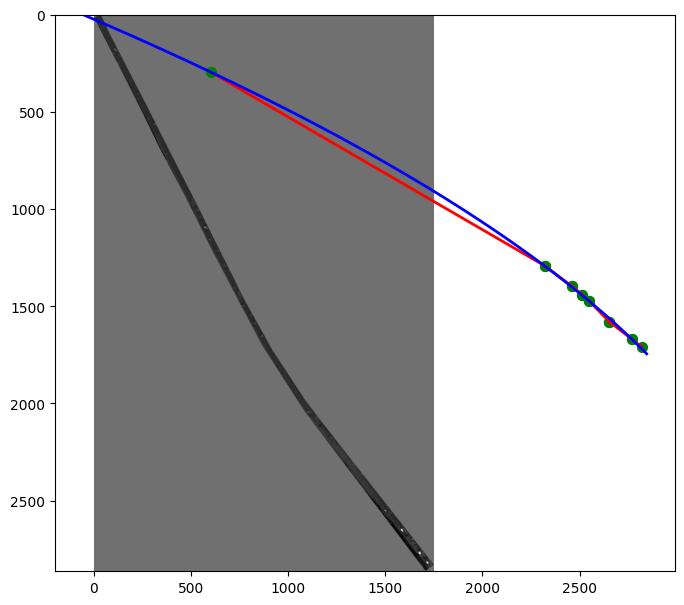

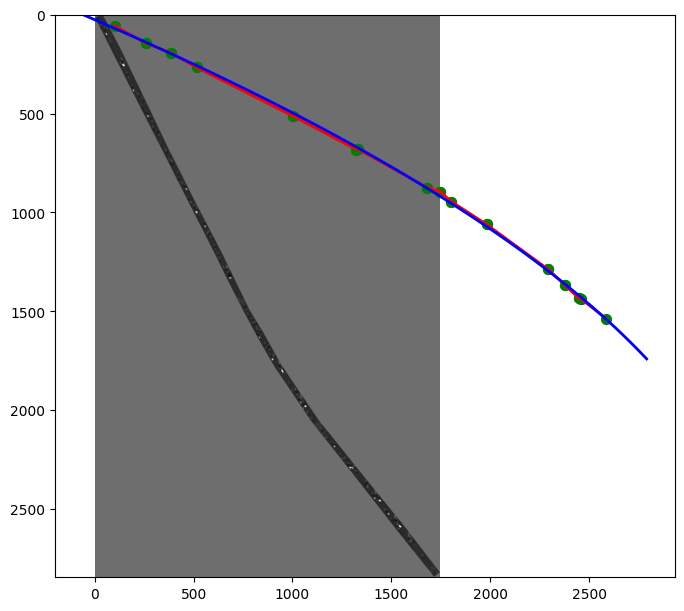

[{'pair': (array([ 452, 1074]), array([ 607, 1073])), 'distance': 0.07750161288644256, 'speed': 1073.0983968720254}, {'pair': (array([ 607, 1073]), array([ 410, 1070])), 'distance': 0.09851142065770851, 'speed': 1364.0031948272542}, {'pair': (array([ 410, 1070]), array([ 352, 1068])), 'distance': 0.029017236257093817, 'speed': 401.7767959844776}, {'pair': (array([ 352, 1068]), array([ 342, 1065])), 'distance': 0.005220153254455275, 'speed': 72.27898723849863}, {'pair': (array([ 342, 1065]), array([ 759, 1064])), 'distance': 0.20850059951952177, 'speed': 2886.9290684193543}, {'pair': (array([ 759, 1064]), array([ 307, 1064])), 'distance': 0.226, 'speed': 3129.2282658481563}, {'pair': (array([ 307, 1064]), array([ 247, 1058])), 'distance': 0.030149626863362672, 'speed': 417.45603798942193}, {'pair': (array([ 247, 1058]), array([ 833, 1054])), 'distance': 0.2930068258590574, 'speed': 4057.014343206243}, {'pair': (array([ 833, 1054]), array([ 234, 1056])), 'distance': 0.29950166944442896, 

In [ ]:
results_list = []
avg_speeds_list = []

for centroids, recon_img in zip(vehicle_centroid_list, recon_imgs_list):

  results, avg_speed, coeffs = find_centroid_pairs(centroids, threshold=100, time_lag=0.26)

  results_list.append(results)

  avg_speeds_list.append(avg_speed)

  pairs_array = [result['pair'] for result in results]

  plot_centroid_pairs(pairs_array, coeffs, recon_img)

print(results_list[0])
print(avg_speeds_list)